In [1]:
import glob
import numpy as np 
import pandas as pd
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from colav.extract_data import * 
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

In [2]:
plt.rcParams["font.size"] = 14
# plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelsize"] = 16
plt.rcParams["axes.labelweight"] = "regular"
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["axes.titleweight"] = "regular"
resnum_bounds = (7,279)

In [3]:
theseus_strucs = sorted(glob.glob('ptp1b_data/ptp1b_theseus_data/*pdb'))

In [4]:
# untreated dihedral data processing
untreated_dihedrals, dihedral_strucs = generate_dihedral_matrix(theseus_strucs, 
                                                                resnum_bounds, 
                                                                save=True, 
                                                                save_prefix='ptp1b_data/ptp1b',
                                                                verbose=False)
# untreated_dihedrals, dihedral_strucs = load_dihedral_matrix('ptp1b_data/ptp1b_dh_dict.pkl')
untreated_dihedrals_data = np.hstack([np.sin(untreated_dihedrals),
                                      np.cos(untreated_dihedrals)])

In [5]:
# rope dihedral data processing 
rope_dihedrals = pd.read_csv('ptp1b_data/filtered-ptp1b.csv')
rope_strucs = np.array([x[:-2] for x in rope_dihedrals.Name.values])
rope_dihedrals.drop(['Unnamed: 0', 'Name'], axis=1, inplace=True)
rope_dihedrals = np.deg2rad(rope_dihedrals.values)
rope_dihedrals_data = np.hstack([np.sin(rope_dihedrals),
                                 np.cos(rope_dihedrals)])

In [6]:
# Dihedral PCA 
# untreated 
u_pca = PCA(n_components=10)
u_A = u_pca.fit_transform(untreated_dihedrals_data)

# rope
rope_pca = PCA(n_components=10)
rope_A = rope_pca.fit_transform(rope_dihedrals_data)

In [7]:
# pairwise distances data processing
# pw_data, pw_strucs = generate_pw_matrix(theseus_strucs, 
#                                         resnum_bounds, 
#                                         save=True, 
#                                         save_prefix='ptp1b_data/ptp1b', 
#                                         verbose=False)
pw_data, pw_strucs = load_pw_matrix('ptp1b_data/ptp1b_pw_dict.pkl')

In [8]:
# Pairwise Distance PCA 
pw_pca = PCA(n_components=10)
pw_A = pw_pca.fit_transform(pw_data)

In [9]:
# strain data processing
sa_data, sa_strucs = generate_strain_matrix(theseus_strucs, 
                                            'ptp1b_data/ptp1b_theseus_data/theseus_1nwl_chainA.pdb', 
                                            'sheart', 
                                            resnum_bounds, 
                                            save=True, 
                                            save_prefix='ptp1b_data/ptp1b_1nwl',
                                            verbose=False)
sa_data, sa_strucs = load_strain_matrix('ptp1b_data/ptp1b_1nwl_sa_sheart_dict.pkl')

Calculating strain against reference ptp1b_data/ptp1b_theseus_data/theseus_1nwl_chainA.pdb...


In [10]:
# Strain Analysis PCA 
sa_pca = PCA(n_components=10)
sa_A = sa_pca.fit_transform(sa_data)

In [11]:
conformation_dict = pickle.load(open('ptp1b_data/ptp1b_conformation_dict.pkl', 'rb'))

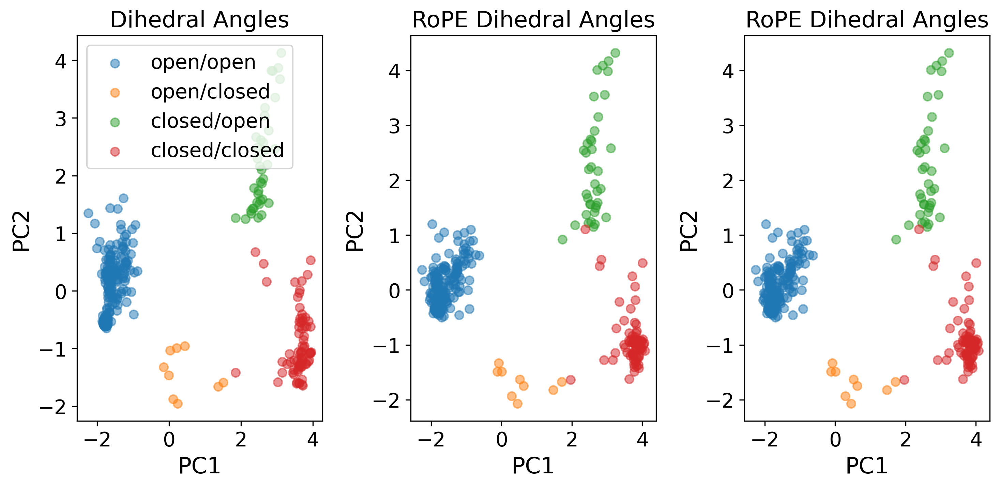

In [ ]:
# PC space plots 
fig, ax = plt.subplots(1, 3, figsize=(10,5), dpi=300); ax = ax.flatten()
pca_list = [u_A, rope_A, rope_A]
struc_list_list = [
    dihedral_strucs, 
    rope_strucs, 
    rope_strucs
]
title_list = [
    "Dihedral Angles", 
    "RoPE Dihedral Angles", 
    "RoPE Dihedral Angles"
]

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)): 

    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]: 
        if k.startswith('ptp1b_data/'): 
            conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
        else: 
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
    cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
    cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
    cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title(title_list[i])
ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

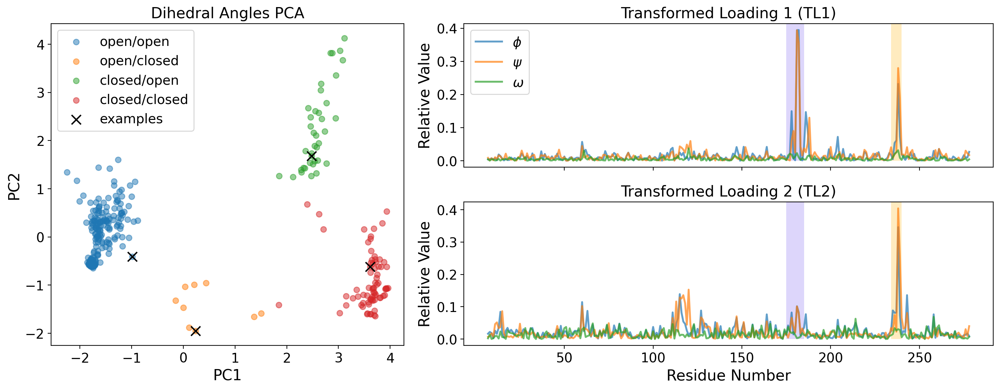

In [13]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic([['left', 'upper right'],
                               ['left', 'lower right']],
                              gridspec_kw=gs_kw,
                              figsize=(15, 6), 
                              layout="constrained", 
                              dpi=200)
for i,ax in enumerate(axd):
    
    if i == 0: 
        # determine conformation color
        conformations = list()
        for k in dihedral_strucs: 
            if k.startswith('ptp1b_data/'): 
                conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
            else: 
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(u_A[conformations == "open_open",0], u_A[conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        axd[ax].scatter(u_A[conformations == "open_closed",0], u_A[conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        axd[ax].scatter(u_A[conformations == "closed_open",0], u_A[conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        axd[ax].scatter(u_A[conformations == "closed_closed",0], u_A[conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        axd[ax].scatter(u_A[[33, 45, 59, 125],0], 
                        u_A[[33, 45, 59, 125],1], 
                        marker='x', 
                        s=100,
                        c='k',
                        label='examples')
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("Dihedral Angles PCA")
        axd[ax].legend(loc="upper left")
        
    else: 
        psi_idx = np.arange(0,untreated_dihedrals_data.shape[1]//2,3)
        omg_idx = np.arange(1,untreated_dihedrals_data.shape[1]//2,3)
        phi_idx = np.arange(2,untreated_dihedrals_data.shape[1]//2,3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        phi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[i-1])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
        psi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[i-1])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)
        omg_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[i-1])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)

        axd[ax].set_title(f'Transformed Loading {i} (TL{i})')
        axd[ax].set_xticks([dh for dh in dh_range if dh%50 == 0], 
                           labels=[dh for dh in dh_range if dh%50 == 0])
#         axd[ax].set_yticks(np.arange(0, axd[ax].get_yticks().max(), 0.1), labels=np.round(np.arange(0, axd[ax].get_yticks().max(), 0.1), 2))

        axd[ax].add_patch(Rectangle((175,0), width=10, height=3.5, # WPD loop 
                    facecolor="#785EF0", 
                    alpha=0.25,
                    fill=True))
        axd[ax].add_patch(Rectangle((234,0), width=6, height=3.5, # L16 loop
                    facecolor="#FFB000", 
                    alpha=0.25,
                    fill=True))

    # if k == 0: 
    #     axd[ax].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
        axd[ax].set_ylabel('Relative Value')
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="upper left")
axd["lower right"].set_xlabel("Residue Number")        
plt.tight_layout()
plt.show()
#     annotate_axes(axd[k], f'axd["{k}"]', fontsize=14)
# fig.suptitle('plt.subplot_mosaic()')

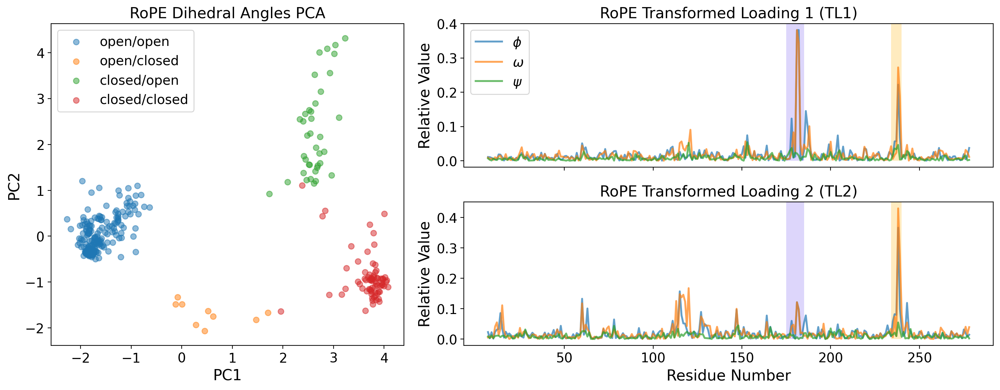

In [14]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic([['left', 'upper right'],
                               ['left', 'lower right']],
                              gridspec_kw=gs_kw,
                              figsize=(15, 6), 
                              layout="constrained", 
                              dpi=200)
for i,ax in enumerate(axd):
    
    if i == 0: 
        # determine conformation color
        conformations = list()
        for k in rope_strucs: 
            if k.startswith('../data'): 
                conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
            else: 
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(rope_A[conformations == "open_open",0], rope_A[conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        axd[ax].scatter(rope_A[conformations == "open_closed",0], rope_A[conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        axd[ax].scatter(rope_A[conformations == "closed_open",0], rope_A[conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        axd[ax].scatter(rope_A[conformations == "closed_closed",0], rope_A[conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        axd[ax].set_ylabel("PC2")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("RoPE Dihedral Angles PCA")
        axd[ax].legend(loc="upper left")
        
    else: 
        psi_idx = np.arange(0,rope_dihedrals_data.shape[1]//2,3)
        omg_idx = np.arange(1,rope_dihedrals_data.shape[1]//2,3)
        phi_idx = np.arange(2,rope_dihedrals_data.shape[1]//2,3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        phi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(rope_pca.components_[i-1])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
        omg_trace, = axd[ax].plot(dh_range, calculate_dh_tl(rope_pca.components_[i-1])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)
        psi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(rope_pca.components_[i-1])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)


        axd[ax].set_title(f'RoPE Transformed Loading {i} (TL{i})')
        axd[ax].set_xticks([dh for dh in dh_range if dh%50 == 0], 
                           labels=[dh for dh in dh_range if dh%50 == 0])
#         axd[ax].set_yticks(np.arange(0, axd[ax].get_yticks().max(), 0.1), labels=np.round(np.arange(0, axd[ax].get_yticks().max(), 0.1), 2))

        axd[ax].add_patch(Rectangle((175,0), width=10, height=3.5, # WPD loop 
                    facecolor="#785EF0", 
                    alpha=0.25,
                    fill=True))
        axd[ax].add_patch(Rectangle((234,0), width=6, height=3.5, # L16 loop
                    facecolor="#FFB000", 
                    alpha=0.25,
                    fill=True))

    # if k == 0: 
    #     axd[ax].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
        axd[ax].set_ylabel('Relative Value')
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="upper left")
axd["lower right"].set_xlabel("Residue Number")        
plt.tight_layout()
plt.show()
#     annotate_axes(axd[k], f'axd["{k}"]', fontsize=14)
# fig.suptitle('plt.subplot_mosaic()')

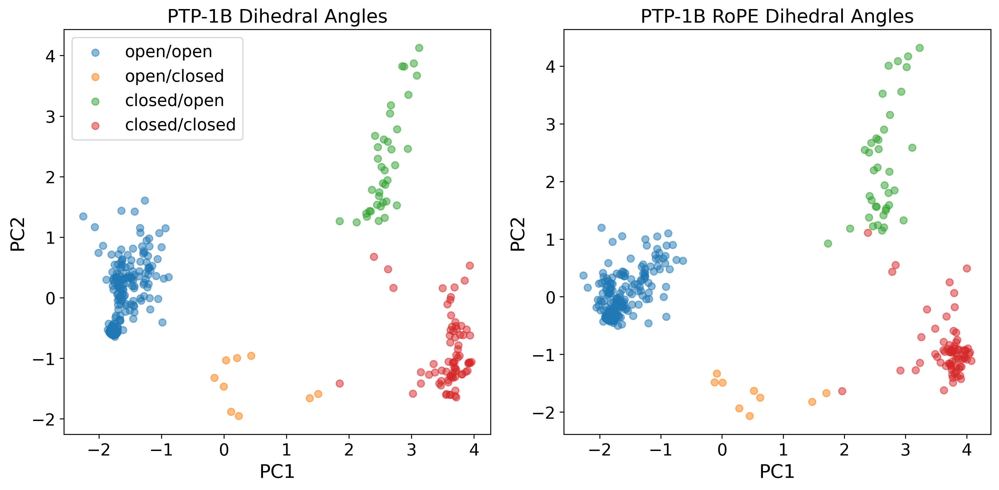

In [49]:
# PC space plots 
fig, ax = plt.subplots(1, 2, figsize=(12,6), dpi=300); ax = ax.flatten()
pca_list = [u_A, rope_A, pw_A]
struc_list_list = [
    dihedral_strucs,  
    rope_strucs, 
    pw_strucs
]
title_list = [
    "Dihedral Angles", 
    "RoPE Dihedral Angles", 
    u"C\u03b1 Pairwise Distances"
]

# enumerate the axes and the list of the PCAs
for i in np.arange(2): 

    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]: 
        if k.startswith('ptp1b_data/'): 
            conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
        else: 
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
    cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
    cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
    cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title('PTP-1B '+title_list[i])
ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

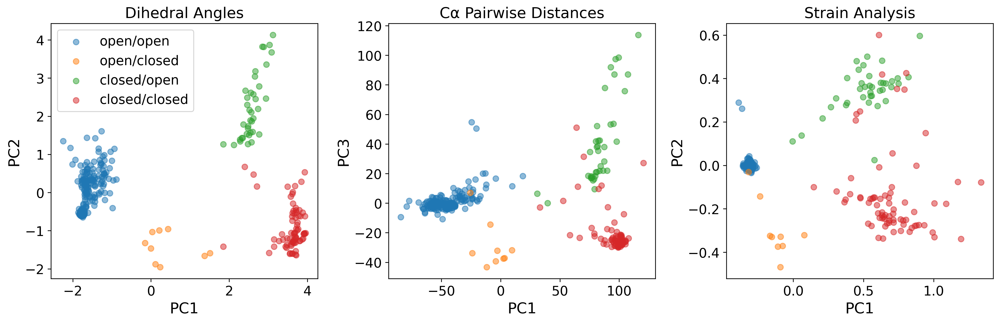

In [41]:
# PC space plots 
fig, ax = plt.subplots(1, 3, figsize=(15,5), dpi=300); ax = ax.flatten()
pca_list = [u_A, pw_A, sa_A]
struc_list_list = [
    dihedral_strucs,  
    pw_strucs, 
    sa_strucs
]
title_list = [
    "Dihedral Angles", 
    u"C\u03b1 Pairwise Distances",
    "Strain Analysis" 
]

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)): 

    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]: 
        if k.startswith('ptp1b_data/'): 
            conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
        else: 
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    if i == 1: 
        
        cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",2], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",2], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",2], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",2], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        ax[i].set_ylabel("PC3")
        ax[i].set_xlabel("PC1")
        ax[i].set_title(title_list[i])
    else: 
        
        cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        ax[i].set_ylabel("PC2")
        ax[i].set_xlabel("PC1")
        ax[i].set_title(title_list[i])
ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

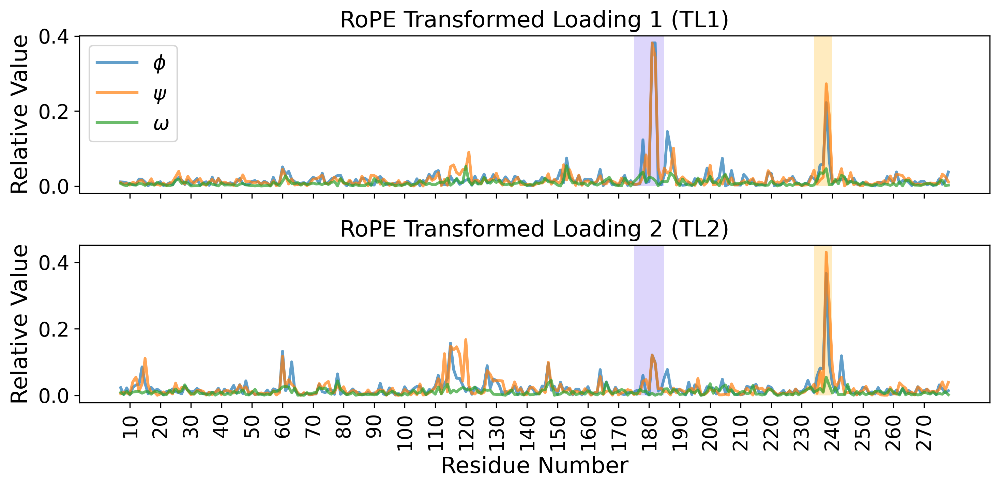

In [46]:
# rope treated dihedrals
r = 2
resnum_bounds = (7,279)
fig, ax = plt.subplots(r,1,figsize=(10,5), dpi=300); ax = ax.flatten()
psi_idx = np.arange(1,rope_dihedrals_data.shape[1]//2,3)
omg_idx = np.arange(0,rope_dihedrals_data.shape[1]//2,3)
phi_idx = np.arange(2,rope_dihedrals_data.shape[1]//2,3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
for k in np.arange(r): 

    phi_trace, = ax[k].plot(dh_range, calculate_dh_tl(rope_pca.components_[k])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
    psi_trace, = ax[k].plot(dh_range, calculate_dh_tl(rope_pca.components_[k])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)
    omg_trace, = ax[k].plot(dh_range, calculate_dh_tl(rope_pca.components_[k])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)

    ax[k].set_title(f'RoPE Transformed Loading {k+1} (TL{k+1})')
    ax[k].set_xticks([dh for dh in dh_range if dh%10 == 0], labels=[dh for dh in dh_range if dh%10 == 0], rotation="vertical")
#     ax[k].set_yticks(np.arange(0, ax[k].get_yticks().max(), 0.1), labels=np.round(np.arange(0, ax[k].get_yticks().max(), 0.1), 2))

    ax[k].add_patch(Rectangle((175,0), width=10, height=3.5, # WPD loop 
                facecolor="#785EF0", 
                alpha=0.25,
                fill=True))
    ax[k].add_patch(Rectangle((234,0), width=6, height=3.5, # L16 loop
                facecolor="#FFB000", 
                alpha=0.25,
                fill=True))

    # if k == 0: 
    #     ax[k].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
    ax[k].set_ylabel('Relative Value')
ax[0].set_xticklabels([])
ax[0].legend(loc="upper left")
ax[-1].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

In [18]:
fragment_strucs = list()
fragment_dihedrals_data = list()
for i,k in enumerate(dihedral_strucs): 
    if "PTP1B-y" in k: 
        fragment_strucs.append(k)
        fragment_dihedrals_data.append(untreated_dihedrals_data[i,:])
fragment_dihedrals_data = np.array(fragment_dihedrals_data)

fragment_pca = PCA(n_components=10)
fragment_A = fragment_pca.fit_transform(fragment_dihedrals_data)

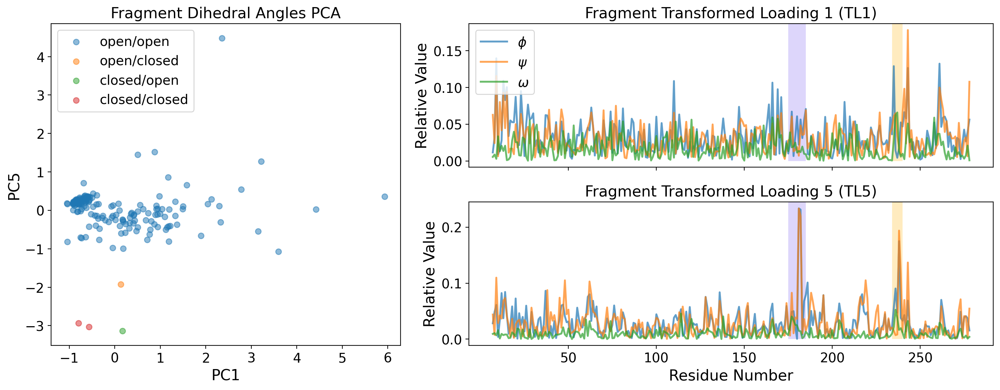

In [19]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic([['left', 'upper right'],
                               ['left', 'lower right']],
                              gridspec_kw=gs_kw,
                              figsize=(15, 6), 
                              layout="constrained", 
                              dpi=200)
tl_list = [-1, 0, 4]
for i,ax in enumerate(axd):
    
    if i == 0: 
        # determine conformation color
        conformations = list()
        for k in fragment_strucs: 
            if k.startswith('ptp1b_data/'): 
                conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
            else: 
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(fragment_A[conformations == "open_open",0], fragment_A[conformations == "open_open",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        axd[ax].scatter(fragment_A[conformations == "open_closed",0], fragment_A[conformations == "open_closed",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        axd[ax].scatter(fragment_A[conformations == "closed_open",0], fragment_A[conformations == "closed_open",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        axd[ax].scatter(fragment_A[conformations == "closed_closed",0], fragment_A[conformations == "closed_closed",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        axd[ax].set_ylabel("PC5")
        axd[ax].set_xlabel("PC1")
        axd[ax].set_title("Fragment Dihedral Angles PCA")
        axd[ax].legend(loc="upper right")
        
    else: 
        psi_idx = np.arange(0,rope_dihedrals_data.shape[1]//2,3)
        omg_idx = np.arange(1,rope_dihedrals_data.shape[1]//2,3)
        phi_idx = np.arange(2,rope_dihedrals_data.shape[1]//2,3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        phi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(fragment_pca.components_[tl_list[i]])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
        psi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(fragment_pca.components_[tl_list[i]])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)
        omg_trace, = axd[ax].plot(dh_range, calculate_dh_tl(fragment_pca.components_[tl_list[i]])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)

        axd[ax].set_title(f'Fragment Transformed Loading {tl_list[i]+1} (TL{tl_list[i]+1})')
        axd[ax].set_xticks([dh for dh in dh_range if dh%50 == 0], 
                           labels=[dh for dh in dh_range if dh%50 == 0])
#         axd[ax].set_yticks(np.arange(0, axd[ax].get_yticks().max(), 0.1), labels=np.round(np.arange(0, axd[ax].get_yticks().max(), 0.1), 2))

        axd[ax].add_patch(Rectangle((175,0), width=10, height=3.5, # WPD loop 
                    facecolor="#785EF0", 
                    alpha=0.25,
                    fill=True))
        axd[ax].add_patch(Rectangle((234,0), width=6, height=3.5, # L16 loop
                    facecolor="#FFB000", 
                    alpha=0.25,
                    fill=True))

    # if k == 0: 
    #     axd[ax].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
        axd[ax].set_ylabel('Relative Value')
axd["left"].legend(loc="upper left")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="upper left")
axd["lower right"].set_xlabel("Residue Number")        
plt.tight_layout()
plt.show()
#     annotate_axes(axd[k], f'axd["{k}"]', fontsize=14)
# fig.suptitle('plt.subplot_mosaic()')

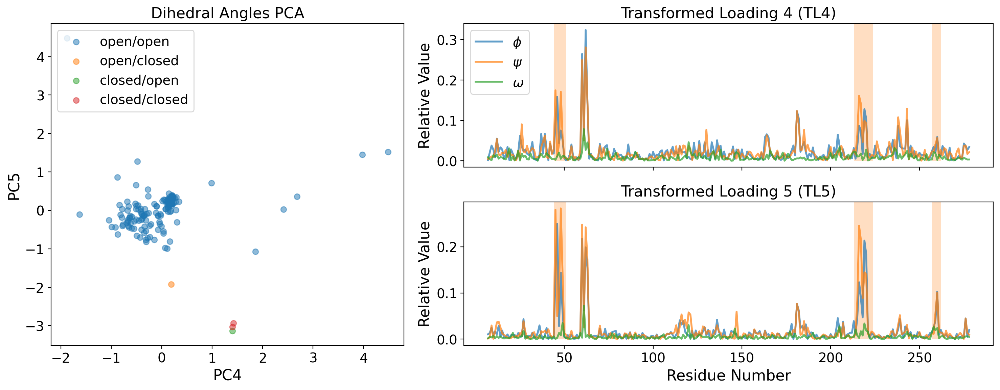

In [20]:
gs_kw = dict(width_ratios=[1, 1.5], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic([['left', 'upper right'],
                               ['left', 'lower right']],
                              gridspec_kw=gs_kw,
                              figsize=(15, 6), 
                              layout="constrained", 
                              dpi=200)
tl_list = [-1, 3, 4]
for i,ax in enumerate(axd):
    
    if i == 0: 
        # determine conformation color
        conformations = list()
        for k in fragment_strucs: 
            if k.startswith('ptp1b_data/'): 
                conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
            else: 
                conformations.append(conformation_dict[k])

        conformations = np.array(conformations)
        axd[ax].scatter(fragment_A[conformations == "open_open",3], fragment_A[conformations == "open_open",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
        axd[ax].scatter(fragment_A[conformations == "open_closed",3], fragment_A[conformations == "open_closed",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
        axd[ax].scatter(fragment_A[conformations == "closed_open",3], fragment_A[conformations == "closed_open",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
        axd[ax].scatter(fragment_A[conformations == "closed_closed",3], fragment_A[conformations == "closed_closed",4], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
        axd[ax].set_ylabel("PC5")
        axd[ax].set_xlabel("PC4")
        axd[ax].set_title("Dihedral Angles PCA")
        axd[ax].legend(loc="upper right")
        
    else: 
        psi_idx = np.arange(0,rope_dihedrals_data.shape[1]//2,3)
        omg_idx = np.arange(1,rope_dihedrals_data.shape[1]//2,3)
        phi_idx = np.arange(2,rope_dihedrals_data.shape[1]//2,3)
        dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
        phi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[tl_list[i]])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
        psi_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[tl_list[i]])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)
        omg_trace, = axd[ax].plot(dh_range, calculate_dh_tl(u_pca.components_[tl_list[i]])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)

        axd[ax].set_title(f'Transformed Loading {tl_list[i]+1} (TL{tl_list[i]+1})')
        axd[ax].set_xticks([dh for dh in dh_range if dh%50 == 0], 
                           labels=[dh for dh in dh_range if dh%50 == 0])
#         axd[ax].set_yticks(np.arange(0, axd[ax].get_yticks().max(), 0.1), labels=np.round(np.arange(0, axd[ax].get_yticks().max(), 0.1), 2))

        axd[ax].add_patch(Rectangle((213,0), width=11, height=3.5, # P loop 
                    facecolor="#ff7f0e", 
                    alpha=0.25,
                    fill=True))
        axd[ax].add_patch(Rectangle((44,0), width=7, height=3.5, # pY loop
                    facecolor="#ff7f0e", 
                    alpha=0.25,
                    fill=True))
        axd[ax].add_patch(Rectangle((257,0), width=5, height=3.5, # Q loop
                    facecolor="#ff7f0e", 
                    alpha=0.25,
                    fill=True))
    # if k == 0: 
    #     axd[ax].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
        axd[ax].set_ylabel('Relative Value')
axd["left"].legend(loc="upper left")
axd["upper right"].set_xticklabels([])
axd["upper right"].legend(loc="upper left")
axd["lower right"].set_xlabel("Residue Number")        
plt.tight_layout()
plt.show()
#     annotate_axes(axd[k], f'axd["{k}"]', fontsize=14)
# fig.suptitle('plt.subplot_mosaic()')

In [21]:
# # PC space plots 
# fig, ax = plt.subplots(3, 3, figsize=(15,15), dpi=100); ax = ax.flatten()

# # enumerate the axes and the list of the PCAs
# for i in np.arange(9): 

#     # determine conformation color
#     conformations = list()
#     for k in fragment_strucs: 
#         if k.startswith('ptp1b_data/'): 
#             conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
#         else: 
#             conformations.append(conformation_dict[k])

#     conformations = np.array(conformations)
#     cluster1 = ax[i].scatter(fragment_A[conformations == "open_open",i], fragment_A[conformations == "open_open",i+1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/open")
#     cluster2 = ax[i].scatter(fragment_A[conformations == "open_closed",i], fragment_A[conformations == "open_closed",i+1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="open/closed")
#     cluster3 = ax[i].scatter(fragment_A[conformations == "closed_open",i], fragment_A[conformations == "closed_open",i+1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/open")
#     cluster4 = ax[i].scatter(fragment_A[conformations == "closed_closed",i], fragment_A[conformations == "closed_closed",i+1], marker='o', alpha=0.5, edgecolor='k', linewidth=1, label="closed/closed")
#     ax[i].set_ylabel(f"PC{i+2}")
#     ax[i].set_xlabel(f"PC{i+1}")
#     ax[i].set_title(f"PC{i+1} v. PC{i+2}")
# # ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
# plt.tight_layout()
# plt.show()

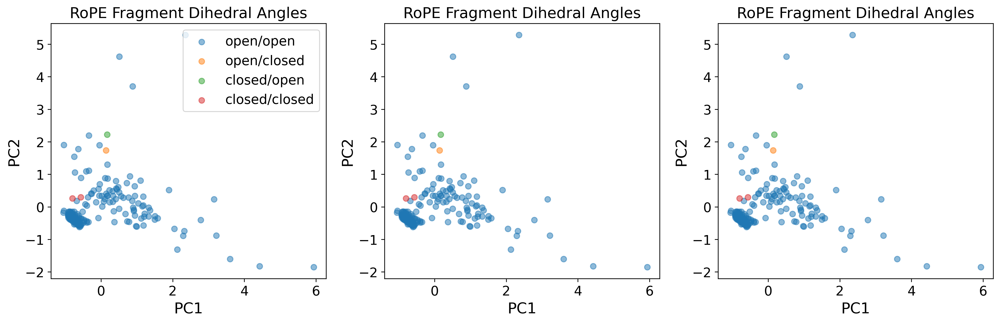

In [23]:
# PC space plots 
fig, ax = plt.subplots(1, 3, figsize=(15,5), dpi=300); ax = ax.flatten()
pca_list = [fragment_A] * 3
struc_list_list = [
    fragment_strucs
] * 3
title_list = [
    "RoPE Fragment Dihedral Angles"
] * 3

# enumerate the axes and the list of the PCAs
for i in np.arange(len(pca_list)): 

    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]: 
        if k.startswith('ptp1b_data/'): 
            conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
        else: 
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(pca_list[i][conformations == "open_open",0], pca_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
    cluster2 = ax[i].scatter(pca_list[i][conformations == "open_closed",0], pca_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
    cluster3 = ax[i].scatter(pca_list[i][conformations == "closed_open",0], pca_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
    cluster4 = ax[i].scatter(pca_list[i][conformations == "closed_closed",0], pca_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
    ax[i].set_ylabel("PC2")
    ax[i].set_xlabel("PC1")
    ax[i].set_title(title_list[i])
ax[0].legend(loc="upper right", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

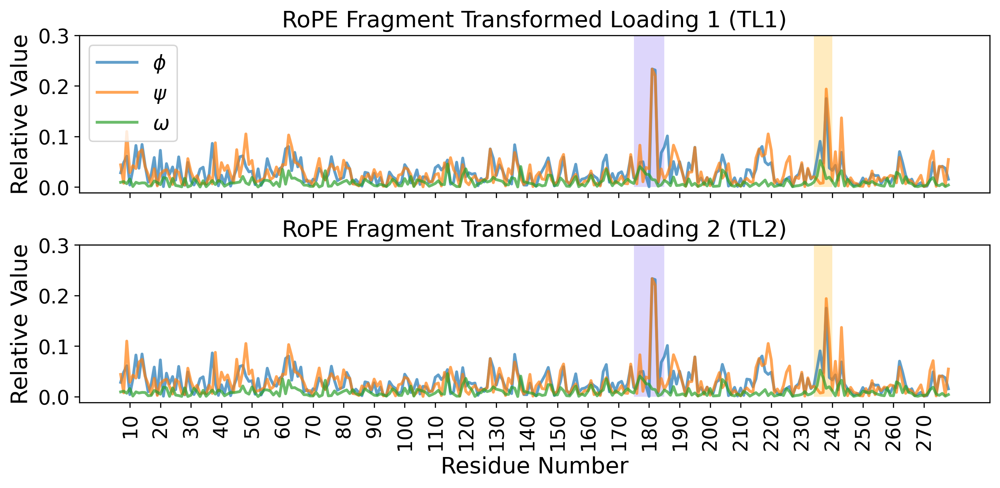

In [24]:
# rope fragment treated dihedrals
r = 2
fig, ax = plt.subplots(r,1,figsize=(10,5),dpi=300); ax = ax.flatten()
psi_idx = np.arange(0,fragment_dihedrals_data.shape[1]//2,3)
omg_idx = np.arange(1,fragment_dihedrals_data.shape[1]//2,3)
phi_idx = np.arange(2,fragment_dihedrals_data.shape[1]//2,3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
for k in np.arange(r): 

    phi_trace, = ax[k].plot(dh_range, calculate_dh_tl(fragment_pca.components_[4])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.7)
    psi_trace, = ax[k].plot(dh_range, calculate_dh_tl(fragment_pca.components_[4])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.7)
    omg_trace, = ax[k].plot(dh_range, calculate_dh_tl(fragment_pca.components_[4])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.7)

    ax[k].set_title(f'RoPE Fragment Transformed Loading {k+1} (TL{k+1})')
    ax[k].set_xticks([dh for dh in dh_range if dh%10 == 0], labels=[dh for dh in dh_range if dh%10 == 0], rotation="vertical")
    ax[k].set_yticks(np.arange(0, ax[k].get_yticks().max(), 0.1), labels=np.round(np.arange(0, ax[k].get_yticks().max(), 0.1), 2))

    ax[k].add_patch(Rectangle((175,0), width=10, height=3.5, # WPD loop 
                facecolor="#785EF0", 
                alpha=0.25,
                fill=True))
    ax[k].add_patch(Rectangle((234,0), width=6, height=3.5, # L16 loop
                facecolor="#FFB000", 
                alpha=0.25,
                fill=True))

    # if k == 0: 
    #     ax[k].legend([phi_trace, omg_trace, psi_trace], [r"$\phi$", r"$\omega$", r"$\psi$"], fontsize=20, loc="upper left")
    ax[k].set_ylabel('Relative Value')
ax[0].set_xticklabels([])
ax[0].legend(loc="upper left")
ax[-1].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

In [25]:
space_group_dict = pickle.load(open('ptp1b_data/ptp1b_sg_dict.pkl', 'rb'))

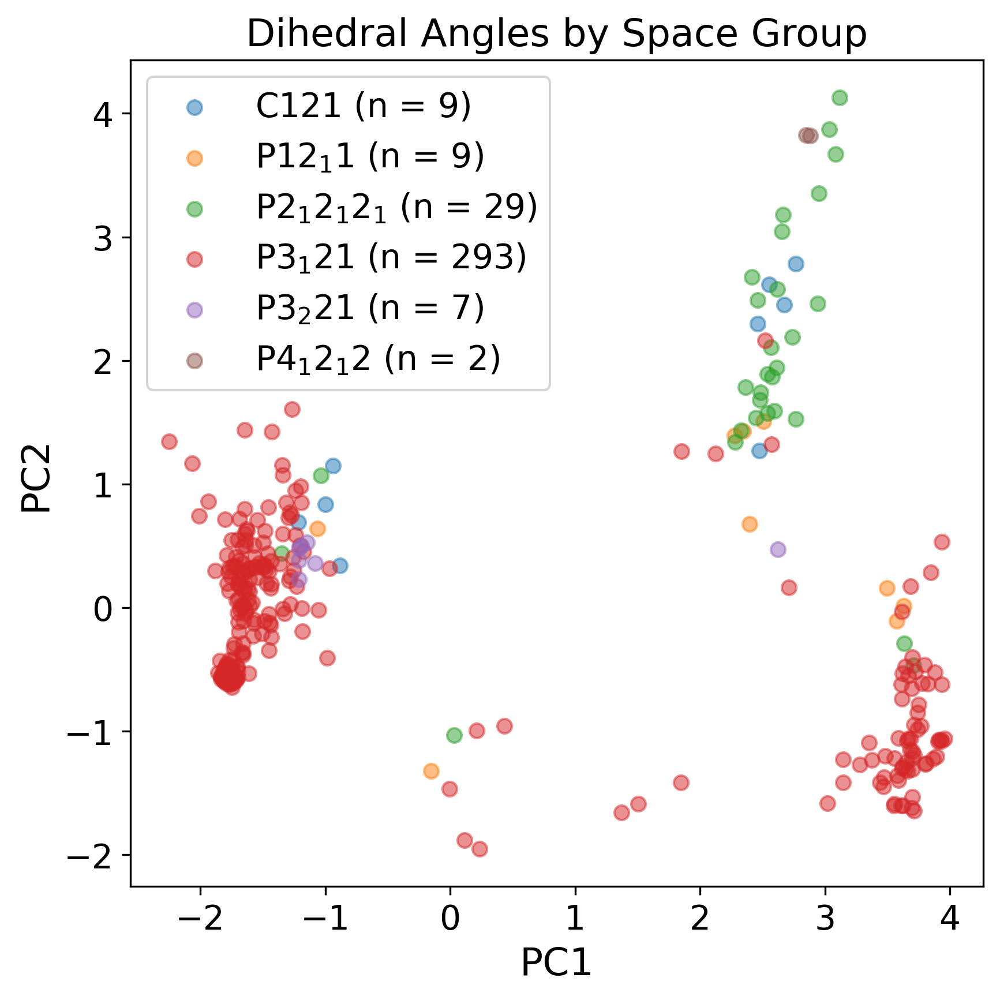

In [26]:
# determine the space groups of each of the structures 
sgs = list()
for i,struc in enumerate(dihedral_strucs): 
    sgs.append(space_group_dict[struc.split('/')[-1].split('_')[-2]])
sgs = np.array(sgs)

# PC plot by space group
fig, ax = plt.subplots(1, 1, figsize=(6,6), dpi=300)# ; ax = ax.flatten()
# for k in np.arange(1): 
for i,sg in enumerate(np.unique(sgs)): 
    ax.scatter(u_A[sgs == sg,0], u_A[sgs == sg,1], marker='o', edgecolor=None, label=f"{sg} (n = {(sgs== sg).sum()})", alpha=0.5)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_title("Dihedral Angles by Space Group")
ax.legend()
plt.tight_layout()
plt.show()

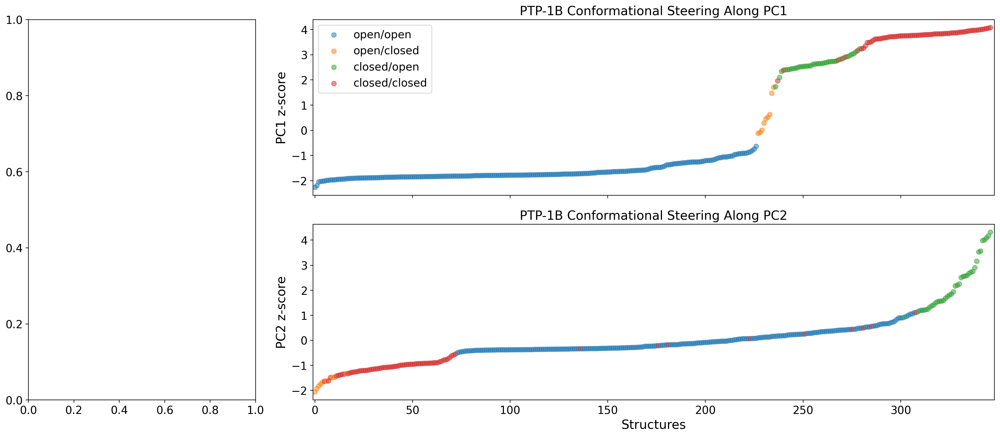

In [38]:
# allosteric steering for rope dihedrals
gs_kw = dict(width_ratios=[1, 3], height_ratios=[1, 1])
fig, axd = plt.subplot_mosaic([['left', 'upper right'],
                               ['left', 'lower right']],
                              gridspec_kw=gs_kw,
                              figsize=(18, 8), 
                              layout="constrained", 
                              dpi=200)
pc1_idxs = np.argsort(rope_A[:,0])
pc2_idxs = np.argsort(rope_A[:,1])
idx_list = [pc1_idxs, pc2_idxs]
for idx,ax in enumerate(axd):
    if idx == 0: 
        pass
    else: 
        c_dict = {"open_open": '#1f77b4', 
                  "open_closed": '#ff7f0e', 
                  "closed_open": '#2ca02c', 
                  "closed_closed": '#d62728'
                 }
        conformations = list()
        for i in rope_strucs[idx_list[idx-1]]: 
            if i.startswith('../data'): 
                conformations.append(c_dict[conformation_dict[i.split('/')[-1][8:-4]]])
            else: 
                conformations.append(c_dict[conformation_dict[i]])
        conformations = np.array(conformations)
        
        axd[ax].scatter(np.arange(rope_A.shape[0]), rope_A[idx_list[idx-1],idx-1], c=conformations, alpha=0.5, marker='o', edgecolor=None)
        axd[ax].set_ylabel(f'PC{idx} z-score')
        axd[ax].set_title(f'PTP-1B Conformational Steering Along PC{idx}')
        axd[ax].set_xlim(left=-1, right=rope_A.shape[0]+1)
        
        axd['upper right'].legend(loc="upper left", 
                                  handles=[cluster1, cluster2, cluster3, cluster4], 
                                  labels=["open/open", "open/closed", "closed/open", "closed/closed"]
                                 )
        axd['upper right'].set_xticklabels([])
        axd['lower right'].set_xlabel('Structures')
plt.tight_layout()
plt.show()

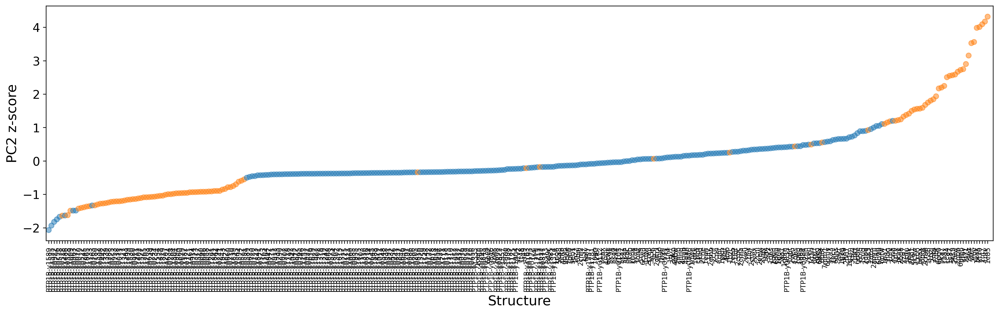

In [28]:
# allosteric steering for rope dihedrals pc 2
fig, ax = plt.subplots(figsize=(20,5), dpi=300)

pc2_idxs = np.argsort(rope_A[:,1])
wpd_conformation = list()
for i,struc in enumerate(rope_strucs[pc2_idxs]): 
    wpd_conformation.append(conformation_dict[struc].split('_')[0])
wpd_conformation = np.array(wpd_conformation)
ax.scatter(np.arange(rope_A.shape[0]), rope_A[pc2_idxs,1], alpha=0.5, c=['tab:blue' if x == 'open' else 'tab:orange' for x in wpd_conformation])
ax.set_xlabel('Structure')
ax.set_ylabel('PC2 z-score')
ax.set_xlim(left=-1, right=rope_A.shape[0]+1)
ax.set_xticks(np.arange(rope_A.shape[0]))
ax.set_xticklabels([x[:-7] for x in rope_strucs[pc1_idxs]], rotation='vertical', fontsize=8)
plt.show()

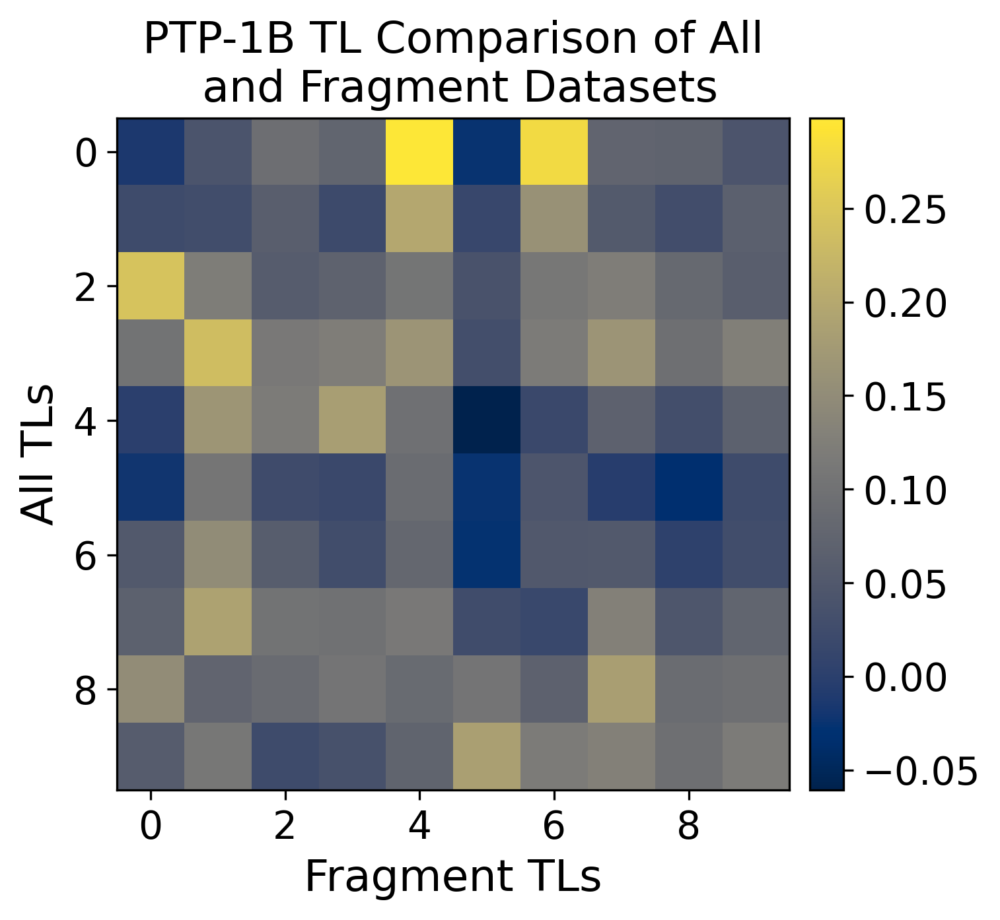

In [44]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(5,5),dpi=300)
dot_matrix = list()
for i in np.arange(10): 
    for j in np.arange(10): 

        dot_matrix.append(pearsonr(calculate_dh_tl(rope_pca.components_[i,:]), 
                                   calculate_dh_tl(fragment_pca.components_[j,:]))[0])

dot_matrix = np.array(dot_matrix).reshape(10,10)
im = ax.imshow(dot_matrix, cmap="cividis", interpolation=None)
divider = make_axes_locatable(plt.gca())
cax = divider.append_axes("right", "5%", pad="3%")
plt.colorbar(im, cax=cax)

plt.tight_layout()

ax.set_xlabel("Fragment TLs")
ax.set_ylabel("All TLs")
ax.set_title("PTP-1B TL Comparison of All\n and Fragment Datasets")
# plt.colorbar(im)
plt.show()

In [30]:
# calculate t-SNE and UMAP 
u_tsne = TSNE(random_state = 0)
u_umap = UMAP(n_neighbors = 50, random_state = 0)
u_tsne_transform = u_tsne.fit_transform(untreated_dihedrals_data)
u_umap_transform = u_umap.fit_transform(untreated_dihedrals_data)

In [31]:
# calculate t-SNE and UMAP for pairwise distances and strain analysis 
pw_tsne = TSNE(random_state = 0)
pw_umap = UMAP(n_neighbors = 50, random_state = 0)
pw_tsne_transform = pw_tsne.fit_transform(pw_data)
pw_umap_transform = pw_umap.fit_transform(pw_data)

sa_tsne = TSNE(random_state = 0) 
sa_umap = UMAP(n_neighbors = 50, random_state = 0)
sa_tsne_transform = sa_tsne.fit_transform(sa_data)
sa_umap_transform = sa_umap.fit_transform(sa_data)

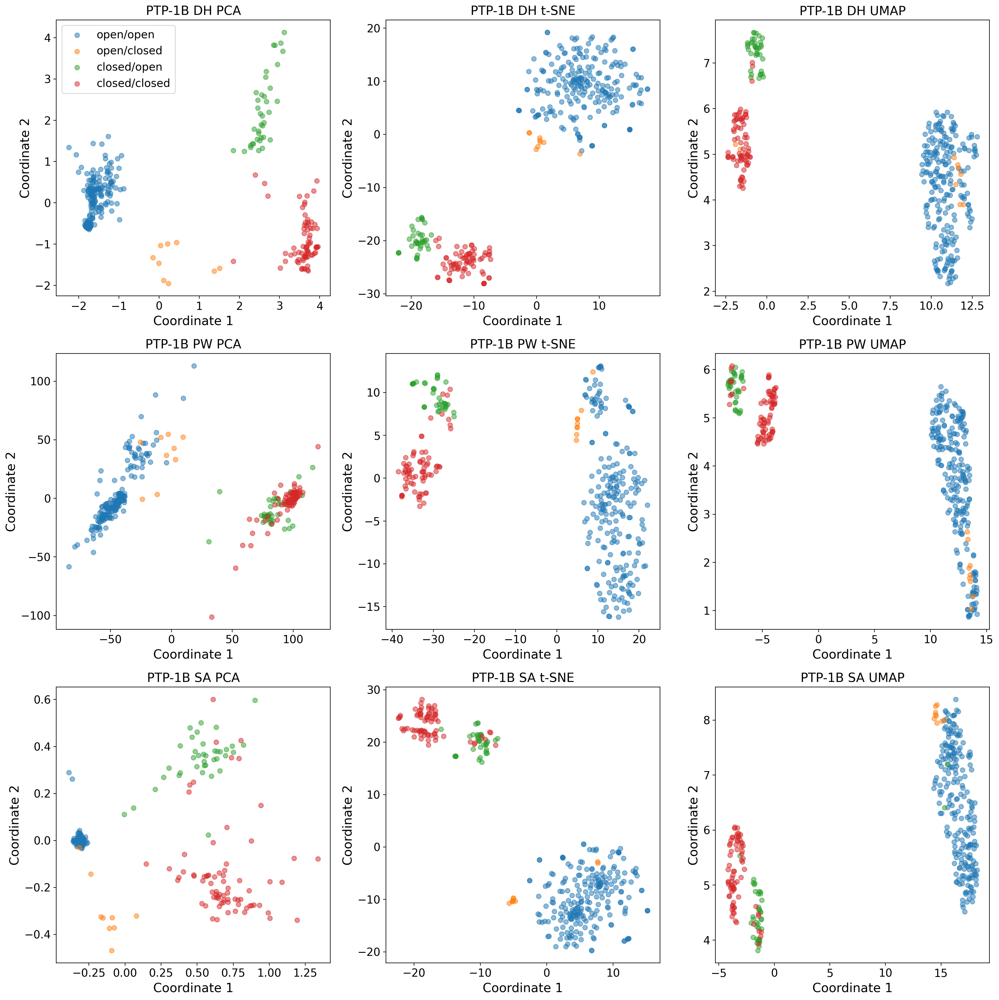

In [48]:
fig, ax = plt.subplots(3, 3, figsize=(18,18), dpi=200); ax = ax.flatten()
transform_list = [
    u_A, 
    u_tsne_transform, 
    u_umap_transform,
    pw_A, 
    pw_tsne_transform, 
    pw_umap_transform,
    sa_A, 
    sa_tsne_transform, 
    sa_umap_transform
]
struc_list_list = [
    dihedral_strucs, 
    dihedral_strucs, 
    dihedral_strucs,
    pw_strucs,  
    pw_strucs, 
    pw_strucs,
    sa_strucs, 
    sa_strucs,
    sa_strucs
]
title_list = [
    "DH PCA", 
    "DH t-SNE", 
    "DH UMAP",
    "PW PCA", 
    "PW t-SNE", 
    "PW UMAP",
    "SA PCA",
    "SA t-SNE", 
    "SA UMAP"
]

for i in np.arange(len(transform_list)): 

    # determine conformation color
    conformations = list()
    for k in struc_list_list[i]: 
        if k.startswith('ptp1b_data/'): 
            conformations.append(conformation_dict[k.split('/')[-1][8:-4]])
        else: 
            conformations.append(conformation_dict[k])

    conformations = np.array(conformations)
    cluster1 = ax[i].scatter(transform_list[i][conformations == "open_open",0], transform_list[i][conformations == "open_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/open")
    cluster2 = ax[i].scatter(transform_list[i][conformations == "open_closed",0], transform_list[i][conformations == "open_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="open/closed")
    cluster3 = ax[i].scatter(transform_list[i][conformations == "closed_open",0], transform_list[i][conformations == "closed_open",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/open")
    cluster4 = ax[i].scatter(transform_list[i][conformations == "closed_closed",0], transform_list[i][conformations == "closed_closed",1], marker='o', alpha=0.5, edgecolor=None, linewidth=1, label="closed/closed")
    ax[i].set_ylabel("Coordinate 2")
    ax[i].set_xlabel("Coordinate 1")
    ax[i].set_title('PTP-1B '+title_list[i])
ax[0].legend(loc="upper left", handles=[cluster1, cluster2, cluster3, cluster4], labels=["open/open", "open/closed", "closed/open", "closed/closed"])
plt.tight_layout()
plt.show()

In [33]:
# create array for storing correlation coefficients 
dh_pw_matrix = list()
dh_sa_matrix = list()
pw_sa_matrix = list() 
psi_idx = np.arange(0,untreated_dihedrals_data.shape[1]//2,3)
omg_idx = np.arange(1,untreated_dihedrals_data.shape[1]//2,3)
phi_idx = np.arange(2,untreated_dihedrals_data.shape[1]//2,3)
# load the shared atom data 
shared_atom_set = pickle.load(open('ptp1b_data/ptp1b_atom_set.pkl', 'rb'))

for i in np.arange(10): 
    for j in np.arange(10): 
        
        # calculate the correlation coefficients 
        dh_pw_matrix.append(pearsonr(calculate_dh_tl(u_pca.components_[i,:])[psi_idx]+calculate_dh_tl(u_pca.components_[i,:])[phi_idx]+calculate_dh_tl(u_pca.components_[i,:])[omg_idx],
                                     calculate_pw_tl(pw_pca.components_[j,:], resnum_bounds)[1:])[0])
        dh_sa_matrix.append(pearsonr(calculate_dh_tl(u_pca.components_[i,:])[psi_idx]+calculate_dh_tl(u_pca.components_[i,:])[phi_idx]+calculate_dh_tl(u_pca.components_[i,:])[omg_idx], 
                                     calculate_sa_tl(sa_pca.components_[j,:], sorted(shared_atom_set))[1:])[0])
        pw_sa_matrix.append(pearsonr(calculate_pw_tl(pw_pca.components_[i,:], resnum_bounds), 
                                     calculate_sa_tl(sa_pca.components_[j,:], sorted(shared_atom_set)))[0])
        
dh_pw_matrix = np.array(dh_pw_matrix).reshape(10,10)
dh_sa_matrix = np.array(dh_sa_matrix).reshape(10,10)
pw_sa_matrix = np.array(pw_sa_matrix).reshape(10,10)

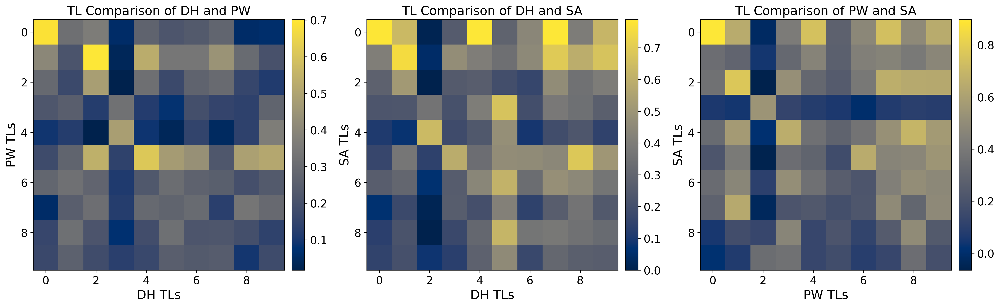

In [34]:
fig, ax = plt.subplots(1, 3, figsize=(18,6),dpi=300); ax = ax.flatten()
axs_list = [
    ('DH', 'PW'), 
    ('DH', 'SA'), 
    ('PW', 'SA')
]
dot_matrix_list = [
    dh_pw_matrix,
    dh_sa_matrix,
    pw_sa_matrix
]
for i in np.arange(3): 
    
    im = ax[i].imshow(dot_matrix_list[i], cmap="cividis", interpolation=None)
    ax[i].set_xlabel(f"{axs_list[i][0]} TLs")
    ax[i].set_ylabel(f"{axs_list[i][1]} TLs")
    ax[i].set_title(f"TL Comparison of {axs_list[i][0]} and {axs_list[i][1]}")
    divider = make_axes_locatable(ax[i])
    cax = divider.append_axes("right", "5%", pad="3%")
    plt.colorbar(im, cax=cax)
plt.tight_layout()
plt.show()

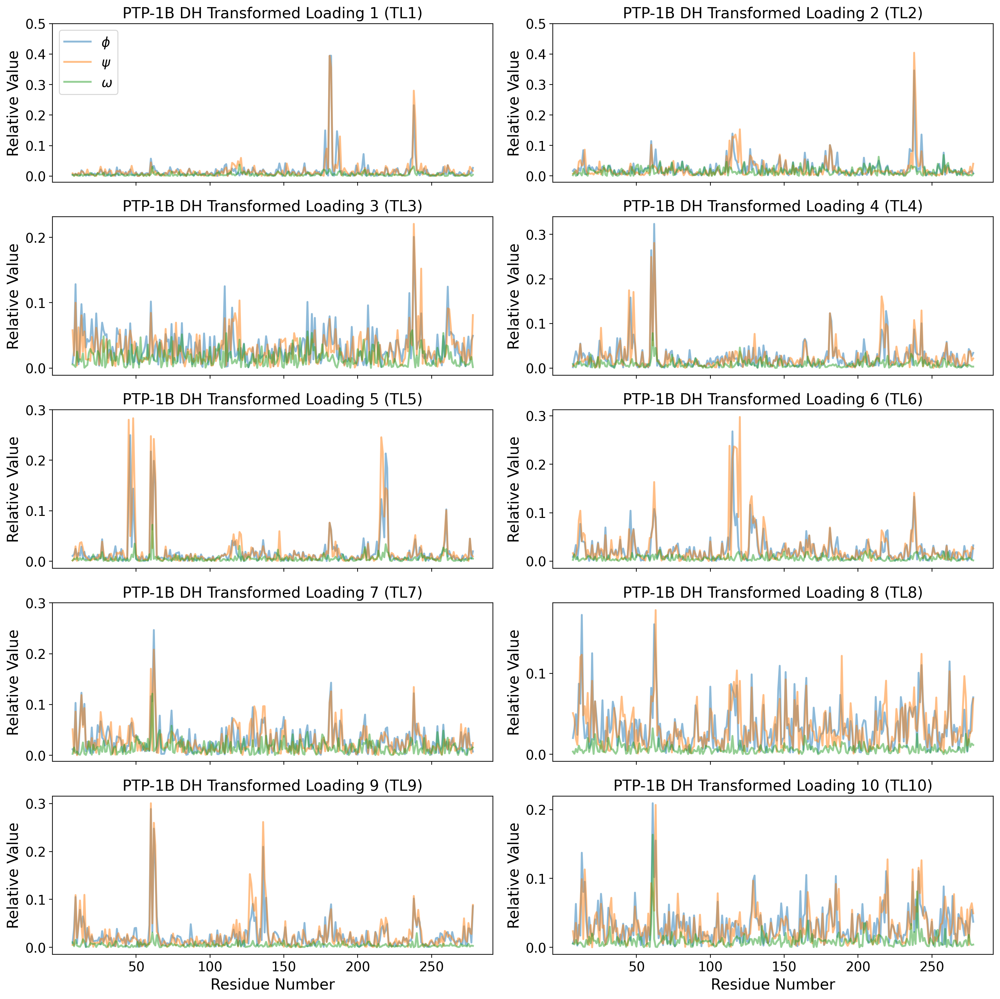

In [35]:
# rope fragment treated dihedrals
r = 10
r_list = [r-1, r-2]
fig, ax = plt.subplots(r//2,2,figsize=(15,15), dpi=200); ax = ax.flatten()
psi_idx = np.arange(0,untreated_dihedrals_data.shape[1]//2,3)
omg_idx = np.arange(1,untreated_dihedrals_data.shape[1]//2,3)
phi_idx = np.arange(2,untreated_dihedrals_data.shape[1]//2,3)
dh_range = np.arange(resnum_bounds[0], resnum_bounds[1])
for k in np.arange(r): 

    phi_trace, = ax[k].plot(dh_range, calculate_dh_tl(u_pca.components_[k])[phi_idx], '-', label=r'$\phi$', linewidth=2, alpha=0.5)
    psi_trace, = ax[k].plot(dh_range, calculate_dh_tl(u_pca.components_[k])[psi_idx], '-', label=r'$\psi$', linewidth=2, alpha=0.5)
    omg_trace, = ax[k].plot(dh_range, calculate_dh_tl(u_pca.components_[k])[omg_idx], '-', label=r'$\omega$', linewidth=2, alpha=0.5)

    ax[k].set_title(f'PTP-1B DH Transformed Loading {k+1} (TL{k+1})')
    ax[k].set_xticks([dh for dh in dh_range if dh%50 == 0], labels=[dh for dh in dh_range if dh%50 == 0])
    ax[k].set_yticks(np.arange(0, ax[k].get_yticks().max(), 0.1), labels=np.round(np.arange(0, ax[k].get_yticks().max(), 0.1), 2))
    ax[k].set_ylabel('Relative Value')
    if k not in r_list: 
        ax[k].set_xticklabels([])
ax[0].legend(loc="upper left")
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

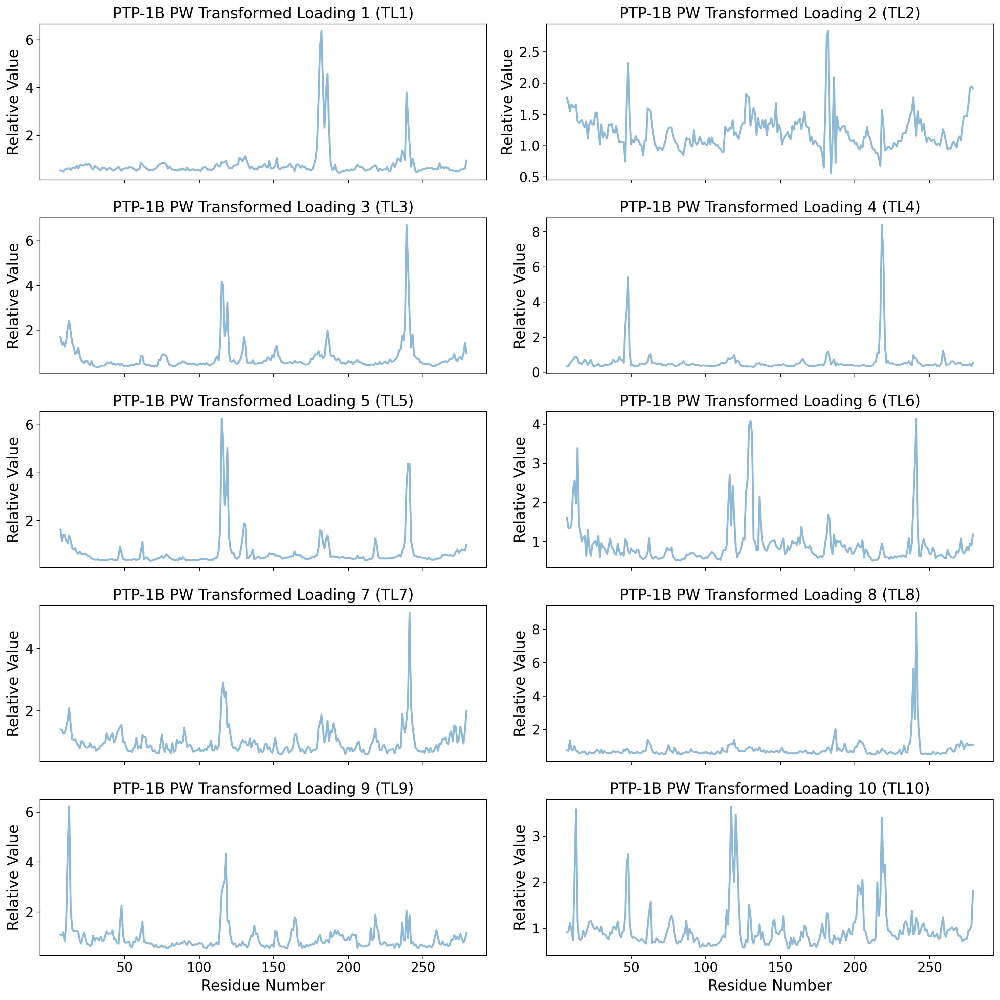

In [36]:
# pairwise distances tranformed loadings 
r = 10
r_list = [r-1, r-2]
fig, ax = plt.subplots(r//2,2,figsize=(15,15), dpi=200); ax = ax.flatten()

for k in np.arange(r): 

    ax[k].plot(np.arange(resnum_bounds[0], resnum_bounds[1]+1), calculate_pw_tl(pw_pca.components_[k], resnum_bounds), '-', linewidth=2, alpha=0.5)
    ax[k].set_title(f'PTP-1B PW Transformed Loading {k+1} (TL{k+1})')
    ax[k].set_xticks([x for x in np.arange(resnum_bounds[0], resnum_bounds[1]+1) if x%50 == 0], 
                     labels=[x for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x%50 == 0])
    
    ax[k].set_ylabel('Relative Value')
    if k not in r_list: 
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()

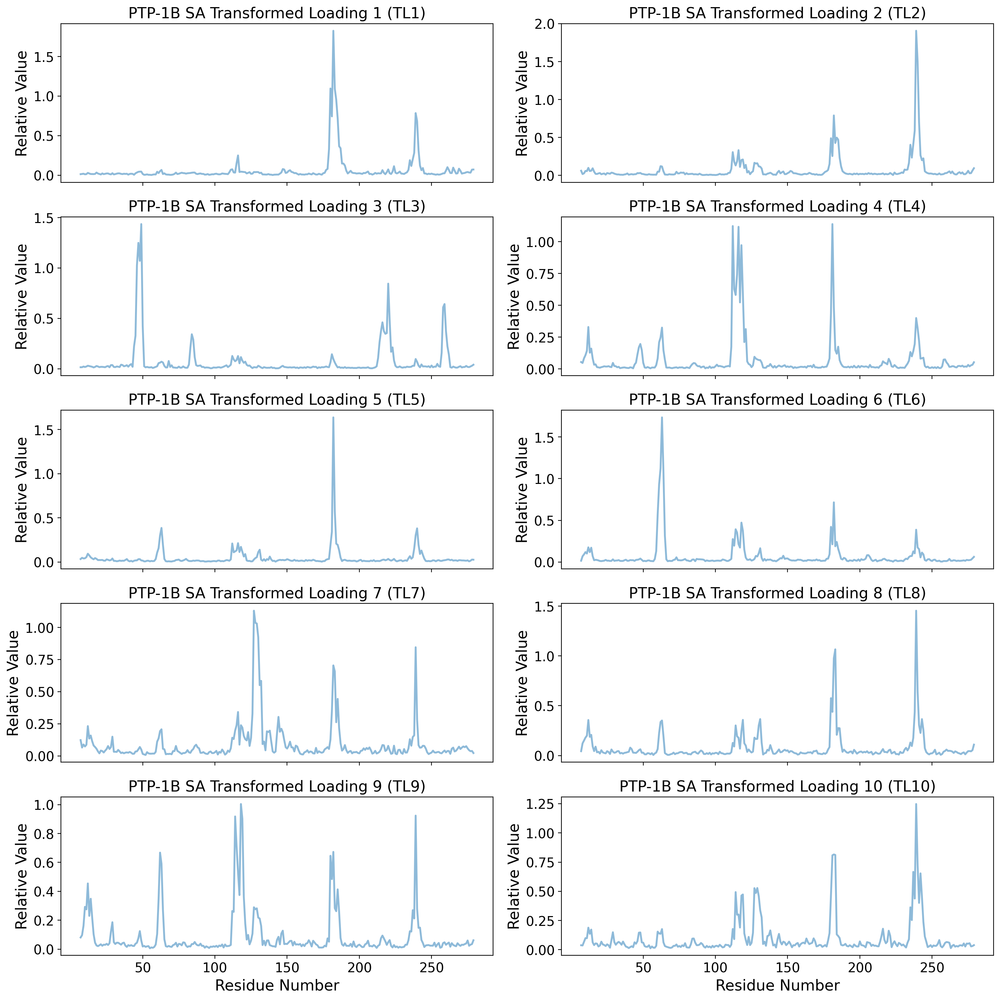

In [37]:
# strain analysis tranformed loadings 
r = 10
r_list = [r-1, r-2]
fig, ax = plt.subplots(r//2,2,figsize=(15,15), dpi=200); ax = ax.flatten()
shared_atom_set = pickle.load(open('ptp1b_data/ptp1b_atom_set.pkl', 'rb'))

for k in np.arange(r): 

    ax[k].plot(np.arange(resnum_bounds[0], resnum_bounds[1]+1), calculate_sa_tl(sa_pca.components_[k], sorted(shared_atom_set)), '-', linewidth=2, alpha=0.5)
    ax[k].set_title(f'PTP-1B SA Transformed Loading {k+1} (TL{k+1})')
    ax[k].set_xticks([x for x in np.arange(resnum_bounds[0], resnum_bounds[1]+1) if x%50 == 0], 
                     labels=[x for x in np.arange(resnum_bounds[0], resnum_bounds[1]) if x%50 == 0])
    
    ax[k].set_ylabel('Relative Value')
    if k not in r_list: 
        ax[k].set_xticklabels([])
ax[-1].set_xlabel("Residue Number")
ax[-2].set_xlabel("Residue Number")
plt.tight_layout()
plt.show()